# **Predicting Customer Satisfaction**
## *Given survey data from an Airline, can we predict the satisfaction of a customer? *
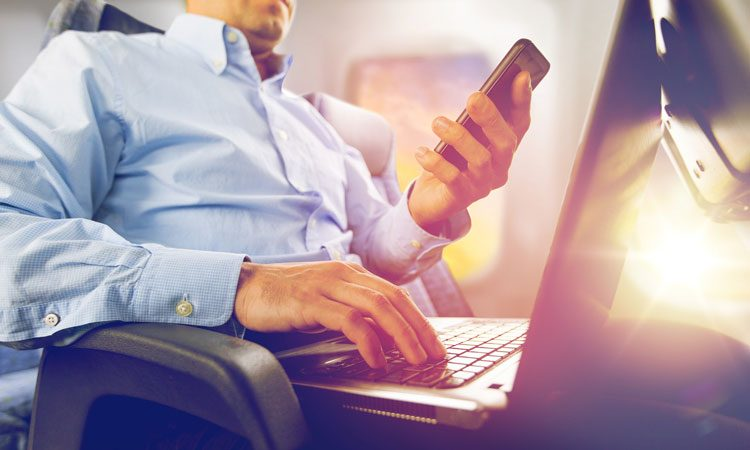

Welcome! This kernels aim is to showcase a few of the basics of data science (data cleaning, encoding, feature engineering, and model training), all while attempting to solve a problem that is common among businesses: *Customer Satisfaction*. 

We will be treating this as a binary classification problem, where we will attemp to create a model that predicts whether a customer was **Satisfied** or **Unsatisfied** with the experience and/or service which an airline provided.

**If you find this kernel helpful, please UPVOTE**

V10 - Fixed bug where test data was being set to train data

V9 - Initial Public Kernel


### Notes about the Dataset
This dataset has already been split into train and test csv files. 80% of the total dataset is in train.csv and 20% is in test.csv

In [35]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import lightgbm as lgb
import xgboost as xgb
import catboost as cb
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, roc_auc_score, accuracy_score, plot_confusion_matrix, classification_report
from scipy import stats

import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [36]:
directory = "data/"
feature_tables = ['train.csv', 'test.csv']

df_train = directory + feature_tables[0]
df_test = directory + feature_tables[1]

# Create dataframes
print(f'Reading csv from {df_train}...')
train = pd.read_csv(df_train)
print('...Complete')

print(f'Reading csv from {df_train}...')
test = pd.read_csv(df_test)
print('...Complete')

Reading csv from data/train.csv...
...Complete
Reading csv from data/train.csv...
...Complete


In [37]:
train.shape 


(103904, 25)

In [38]:
test.shape

(25976, 25)

In [39]:
train.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


## Clean and Transform Dataset
Based on the training data above, there are several things we need to do in order to prepare the data for use in a model. There are several catagorical variables that need to be encoded, including our target variable 'Satisfaction'. There are also a couple of columns that are unnecessary, such as 'Unnamed:0' and 'id'. We can drop these. The functions below will be used to perform the dataset preparation.

In [40]:
def transform_gender(x):
    if x == 'Female':
        return 1
    elif x == 'Male':
        return 0
    else:
        return -1
    
def transform_customer_type(x):
    if x == 'Loyal Customer':
        return 1
    elif x == 'disloyal Customer':
        return 0
    else:
        return -1
    
def transform_travel_type(x):
    if x == 'Business travel':
        return 1
    elif x == 'Personal Travel':
        return 0
    else:
        return -1
    
def transform_class(x):
    if x == 'Business':
        return 2
    elif x == 'Eco Plus':
        return 1
    elif x == 'Eco':
        return 0    
    else:
        return -1
    
def transform_satisfaction(x):
    if x == 'satisfied':
        return 1
    elif x == 'neutral or dissatisfied':
        return 0
    else:
        return -1
    
def process_data(df):
    df = df.drop(['Unnamed: 0', 'id'], axis = 1)
    df['Gender'] = df['Gender'].apply(transform_gender)
    df['Customer Type'] = df['Customer Type'].apply(transform_customer_type)
    df['Type of Travel'] = df['Type of Travel'].apply(transform_travel_type)
    df['Class'] = df['Class'].apply(transform_class)
    df['satisfaction'] = df['satisfaction'].apply(transform_satisfaction)
    df['Arrival Delay in Minutes'].fillna(df['Arrival Delay in Minutes'].median(), inplace = True)
    
    return df

train = process_data(train)
test = process_data(test)

In [41]:
train.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,1,13,0,1,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,0
1,0,0,25,1,2,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,0
2,1,1,26,1,2,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,1
3,1,1,25,1,2,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,0
4,0,1,61,1,2,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,1


In [42]:
train.describe()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,...,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,0.507459,0.817322,39.379706,0.689627,1.028103,1189.448375,2.729683,3.060296,2.756901,2.976883,...,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.133392,0.433333
std,0.499947,0.386404,15.114964,0.462649,0.962858,997.147281,1.327829,1.525075,1.398929,1.277621,...,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.649776,0.495538
min,0.000000,0.000000,7.000000,0.000000,0.000000,31.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,27.000000,0.000000,0.000000,414.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,40.000000,1.000000,1.000000,843.000000,3.000000,3.000000,3.000000,3.000000,...,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,51.000000,1.000000,2.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000,1.000000
max,1.000000,1.000000,85.000000,1.000000,2.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000,1.000000


In [43]:
test.describe()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
count,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,...,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.000000,25976.00000,25976.000000,25976.000000
mean,0.507083,0.815253,39.620958,0.694410,1.035841,1193.788459,2.724746,3.046812,2.756775,2.977094,...,3.357753,3.385664,3.350169,3.633238,3.314175,3.649253,3.286226,14.30609,14.693756,0.438982
std,0.499959,0.388100,15.135685,0.460666,0.961744,998.683999,1.335384,1.533371,1.412951,1.282133,...,1.338299,1.282088,1.318862,1.176525,1.269332,1.180681,1.319330,37.42316,37.466787,0.496272
min,0.000000,0.000000,7.000000,0.000000,0.000000,31.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,0.000000,1.000000,27.000000,0.000000,0.000000,414.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.00000,0.000000,0.000000
50%,1.000000,1.000000,40.000000,1.000000,1.000000,849.000000,3.000000,3.000000,3.000000,3.000000,...,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.00000,0.000000,0.000000
75%,1.000000,1.000000,51.000000,1.000000,2.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,...,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.00000,13.000000,1.000000
max,1.000000,1.000000,85.000000,1.000000,2.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1128.00000,1115.000000,1.000000


In [44]:
train.isna()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
103900,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
103901,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
103902,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [45]:
test.isna()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25971,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
25972,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
25973,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
25974,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Nice! We now have every feature properly coded, almost time to start creating some models! But first, we will want to normalize our dataset via StandardScaler. Even if the model you are using does not care about a normalized dataset, I still like to do it just out of routine.

In [46]:
#Define our features and target (this is helpful in case you would like to drop any features that harm model performance)
features = ['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
target = ['satisfaction']

# Split into test and train
X_train = train[features]
y_train = train[target].to_numpy()
X_test = test[features]
y_test = test[target].to_numpy()

# Normalize Features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

Normalization Complete! Also, just for kicks, lets take a look at a correlation heatmap to see which features correlate well with customer satisfaction.
* **Best features** - Online Booking, Class, and Type of Travel
* **Worst features** - Gate location, Gender, and Departure/Arrival Time Convenient

We will keep all of our features in for now, but can always return to this step in case we want to drop features.

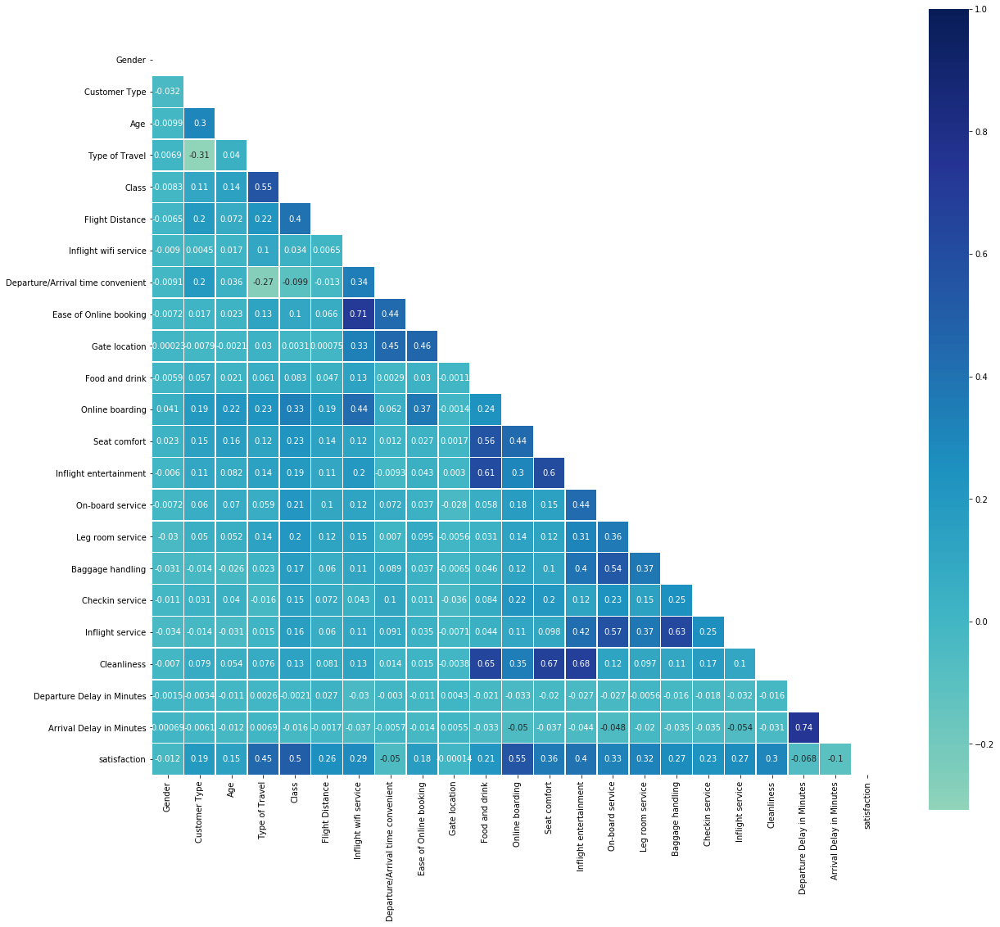

In [47]:
corr = train.corr(method='spearman')
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 18))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot = True, mask=mask, cmap="YlGnBu", center=0,
            square=True, linewidths=.5)

## Model Evaluation

Now to the models! We will be trying out a few different models to see which one is the best choice for our problem. I have created a small function below which will train, predict, and evaluate all of our models. We will be evaluating performance of our models with the ROC_AUC metric. This metric is good for classification of a dataset which a relatively balance dataset in terms of our target. We will also be looking at the confusion matrix for our model to best understand how our model is mischaracterizing predictions (Are we seeing majority false positives? etc.) 

Note that I did some hyperparameter tuning on some of the models, but not all. I will be publishing another kernel showing how to tune hyperparameters, so stay tuned!

In [48]:
def run_model(model, X_train, y_train, X_test, y_test, verbose=True):
    if verbose == False:
        model.fit(X_train,y_train, verbose=0)
    else:
        model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    roc_auc = roc_auc_score(y_test, y_pred)
    print("ROC_AUC = {}".format(roc_auc))
    print(classification_report(y_test,y_pred,digits=5))
    plot_confusion_matrix(model, X_test, y_test,cmap=plt.cm.Blues, normalize = 'all')
    
    return model, roc_auc

### Random Forest 

A great place to start! We are seeing an accuracy of 96.30%. Lets see if the other models can compare.

ROC_AUC = 0.9607290873474874
              precision    recall  f1-score   support

           0    0.95556   0.97969   0.96747     14573
           1    0.97318   0.94177   0.95722     11403

    accuracy                        0.96304     25976
   macro avg    0.96437   0.96073   0.96234     25976
weighted avg    0.96329   0.96304   0.96297     25976



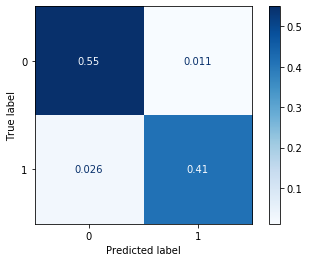

In [49]:
params_rf = {'max_depth': 25,
         'min_samples_leaf': 1,
         'min_samples_split': 2,
         'n_estimators': 1200,
         'random_state': 42}

model_rf = RandomForestClassifier(**params_rf)
model_rf, roc_auc_rf = run_model(model_rf, X_train, y_train, X_test, y_test)

# Wir benutzen hier die Lime Library 

In [50]:
import lime.lime_tabular

In [51]:
limeexplainer = lime.lime_tabular.LimeTabularExplainer(training_data = X_train, mode = "classification", training_labels = features, feature_names=features)

exp = limeexplainer.explain_instance(X_test[10], model_rf.predict_proba)



In [52]:
exp.show_in_notebook()

In [53]:
exp.show_in_notebook(show_table=True, show_all = True)

# Wir benutzen ab hier AIX360

In [54]:
from aix360.algorithms.lime import LimeTabularExplainer

In [55]:
limeexplainer = LimeTabularExplainer(training_data = X_train, mode = "classification", training_labels = features, feature_names=features)

exp = limeexplainer.explain_instance(X_test[10], model_rf.predict_proba)

In [56]:
exp.show_in_notebook()

In [57]:
exp.show_in_notebook(show_table=True, show_all = True)

### LightGBM

Not bad LightGBM! But not quite up at 'Random Forest' levels. Lets keep going!

ROC_AUC = 0.9621206999312578
              precision    recall  f1-score   support

           0    0.95688   0.98072   0.96865     14573
           1    0.97455   0.94352   0.95878     11403

    accuracy                        0.96439     25976
   macro avg    0.96571   0.96212   0.96372     25976
weighted avg    0.96464   0.96439   0.96432     25976



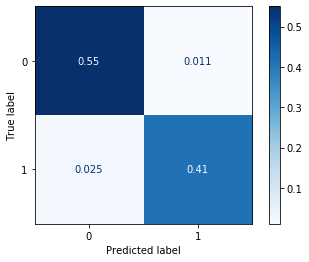

In [58]:
params_lgb ={'colsample_bytree': 0.85, 
         'max_depth': 15, 
         'min_split_gain': 0.1, 
         'n_estimators': 200, 
         'num_leaves': 50, 
         'reg_alpha': 1.2, 
         'reg_lambda': 1.2, 
         'subsample': 0.95, 
         'subsample_freq': 20}

model_lgb = lgb.LGBMClassifier(**params_lgb)
model_lgb, roc_auc_lgb = run_model(model_lgb, X_train, y_train, X_test, y_test)

# Wir benutzen hier Lime

In [59]:
limeexplainer = lime.lime_tabular.LimeTabularExplainer(training_data = X_train, mode = "classification", training_labels = features, feature_names=features)

exp = limeexplainer.explain_instance(X_test[10], model_lgb.predict_proba)

In [60]:
exp.show_in_notebook()

In [61]:
exp.show_in_notebook(show_table=True, show_all = True)

# Ab hier aix360

In [62]:
limeexplainer = LimeTabularExplainer(training_data = X_train, mode = "classification", training_labels = features, feature_names=features)

exp = limeexplainer.explain_instance(X_test[10], model_lgb.predict_proba)

In [63]:
exp.show_in_notebook()

In [64]:
exp.show_in_notebook(show_table=True, show_all = True)

### Catboost

Pretty good for not having tuned hyperparameters here. Expect a performance boost once that is completed.

In [65]:
limeexplainer = lime.lime_tabular.LimeTabularExplainer(training_data = X_train, mode = "classification", training_labels = features, feature_names=features)

exp = limeexplainer.explain_instance(X_test[10], model_rf.predict_proba)

ROC_AUC = 0.9621246776435761
              precision    recall  f1-score   support

           0    0.95822   0.97880   0.96840     14573
           1    0.97214   0.94545   0.95861     11403

    accuracy                        0.96416     25976
   macro avg    0.96518   0.96212   0.96350     25976
weighted avg    0.96433   0.96416   0.96410     25976



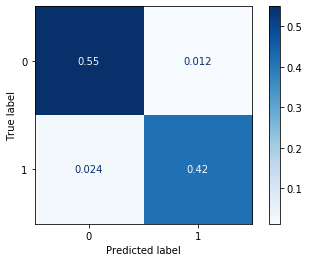

In [66]:
params_cb ={}

model_cb = cb.CatBoostClassifier(**params_cb)
model_cb, roc_auc_cb = run_model(model_cb, X_train, y_train, X_test, y_test, verbose=False)

### XGBoost

I expected more from you XGBoost ;)

ROC_AUC = 0.9613126285764666
              precision    recall  f1-score   support

           0    0.95778   0.97770   0.96764     14573
           1    0.97072   0.94493   0.95765     11403

    accuracy                        0.96331     25976
   macro avg    0.96425   0.96131   0.96264     25976
weighted avg    0.96346   0.96331   0.96325     25976



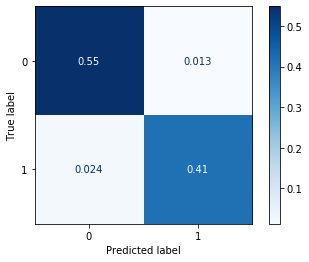

In [67]:
params_xgb ={}

model_xgb = xgb.XGBClassifier(**params_xgb)
model_xgb, roc_auc_xgb = run_model(model_xgb, X_train, y_train, X_test, y_test)

## Model Comparison and Conclusions

Based on the roc_auc metric, we have a clean winner. Our Random forest classifier outperformed all of our other models. One thing to keep in mind is that both the Catboost and the XGBoost classifiers just used default parameters without any hyperparameter tuning. 

In [68]:
auc_scores = [roc_auc_rf, roc_auc_lgb, roc_auc_cb, roc_auc_xgb]
model_scores = pd.DataFrame(auc_scores, index=['Random Forest','LightGBM','Catboost','XGBoost'], columns=['AUC'])
model_scores.head()

,AUC
Random Forest,0.960729
LightGBM,0.962121
Catboost,0.962125
XGBoost,0.961313
